In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%pip install ultralytics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.8/750.8 kB 7.6 MB/s eta 0:00:00


In [ ]:
import zipfile

with zipfile.ZipFile('/content/drive/MyDrive/KITA_1026/project/ocr/data.zip') as target_file:

    target_file.extractall('/content/data/') # 압축풀기

In [ ]:
!cat /content/drive/MyDrive/KITA_1026/project/ocr/obstacles_data/data.yaml

names:
- person
- bicycle
- car
- motorcycle
- bus
- tree_trunk
- traffic_light
- stop
- carrier
- cat
- dog
- movable_signage
- scooter
- stroller
- truck
- wheelchair
- barricade
- bench
- bollard
- chair
- fire_hydrant
- kiosk
- parking_meter
- pole
- potted_plant
- power_controller
- table
- traffic_light_controller
- traffic_sign
nc: 29
test: /content/data/test/images/
train: /content/data/train/images/
val: /content/data/valid/images/


In [ ]:
!pip install PyYAML -q

In [ ]:
!ls

drive  sample_data


In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt') # load a pretrained YOLOv8n detection model

100%|██████████| 6.23M/6.23M [00:00<00:00, 177MB/s]


In [ ]:
print(type(model.names), len(model.names))

print(model.names)

<class 'dict'> 80
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell p

In [ ]:
model.train(data='/content/drive/MyDrive/KITA_1026/project/ocr/obstacles_data/data.yaml', epochs=50, patience=10, batch=32, imgsz=1024)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/KITA_1026/project/ocr/obstacles_data/data.yaml, epochs=50, time=None, patience=10, batch=32, imgsz=1024, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, 

train: Scanning /content/data/train/labels... 9008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9008/9008 [00:05<00:00, 1613.41it/s]

train: WARNING ⚠️ /content/data/train/images/MP_SEL_005259.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/data/train/images/MP_SEL_018950.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/data/train/images/MP_SEL_267844_B120348.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/data/train/images/MP_SEL_MIN_000230.jpg: 1 duplicate labels removed


train: New cache created: /content/data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/data/valid/labels... 1127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1127/1127 [00:01<00:00, 660.95it/s]

val: New cache created: /content/data/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000303, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      16.4G      1.572      3.174      1.313        225       1024: 100%|██████████| 282/282 [07:17<00:00,  1.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:21<00:00,  1.21s/it]


                   all       1127      10523      0.604       0.26       0.27      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      13.7G      1.468      2.013      1.268        231       1024: 100%|██████████| 282/282 [06:55<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:21<00:00,  1.18s/it]


                   all       1127      10523      0.559      0.358      0.382      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      13.9G      1.432      1.803      1.248        296       1024: 100%|██████████| 282/282 [06:55<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.16s/it]


                   all       1127      10523      0.485       0.42       0.42       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      13.9G      1.413      1.679      1.237        410       1024: 100%|██████████| 282/282 [07:00<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


                   all       1127      10523      0.577      0.389      0.443      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      13.5G      1.392      1.561       1.22        329       1024: 100%|██████████| 282/282 [06:58<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


                   all       1127      10523      0.577      0.451      0.468      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      13.7G      1.369      1.471      1.208        312       1024: 100%|██████████| 282/282 [06:58<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:19<00:00,  1.07s/it]


                   all       1127      10523      0.626      0.446      0.488      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      14.2G      1.354      1.418      1.196        259       1024: 100%|██████████| 282/282 [06:54<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.16s/it]


                   all       1127      10523      0.647      0.455      0.517      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      12.9G      1.343      1.377      1.193        289       1024: 100%|██████████| 282/282 [06:58<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.16s/it]


                   all       1127      10523      0.599      0.474      0.516      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50        13G      1.329      1.332      1.182        243       1024: 100%|██████████| 282/282 [07:01<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


                   all       1127      10523      0.601      0.502      0.529      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      15.7G      1.322      1.304      1.175        288       1024: 100%|██████████| 282/282 [07:01<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.05s/it]


                   all       1127      10523      0.663      0.479      0.537      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      14.6G      1.307      1.277      1.171        297       1024: 100%|██████████| 282/282 [07:00<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.02s/it]


                   all       1127      10523      0.657      0.477       0.55      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      14.7G      1.302      1.259      1.165        287       1024: 100%|██████████| 282/282 [07:00<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.02s/it]


                   all       1127      10523      0.646      0.491      0.546       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      13.8G      1.291      1.238      1.162        244       1024: 100%|██████████| 282/282 [06:58<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


                   all       1127      10523      0.594      0.525      0.559      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      14.5G       1.28      1.219      1.154        282       1024: 100%|██████████| 282/282 [06:59<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.05s/it]


                   all       1127      10523      0.643      0.514      0.559      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50        13G      1.273      1.197       1.15        238       1024: 100%|██████████| 282/282 [07:05<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.16s/it]


                   all       1127      10523      0.662      0.505      0.563      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      14.5G      1.271      1.184      1.146        350       1024: 100%|██████████| 282/282 [07:02<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:19<00:00,  1.09s/it]


                   all       1127      10523       0.69      0.498       0.57      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      14.8G      1.266      1.173      1.142        231       1024: 100%|██████████| 282/282 [07:10<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.04s/it]


                   all       1127      10523      0.677      0.512      0.579      0.365

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      12.9G      1.254      1.152      1.137        224       1024: 100%|██████████| 282/282 [07:05<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.01s/it]


                   all       1127      10523      0.678      0.513      0.583      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      13.7G      1.247      1.146      1.133        290       1024: 100%|██████████| 282/282 [07:08<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


                   all       1127      10523      0.692      0.527      0.587      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      14.5G      1.244      1.132      1.133        230       1024: 100%|██████████| 282/282 [06:52<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


                   all       1127      10523      0.668      0.533      0.594      0.379

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      12.6G       1.24      1.122      1.128        259       1024: 100%|██████████| 282/282 [06:51<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.05s/it]


                   all       1127      10523      0.699      0.526      0.592      0.381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      15.6G      1.236      1.113      1.126        255       1024: 100%|██████████| 282/282 [06:50<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.05s/it]


                   all       1127      10523      0.689      0.544      0.602      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      12.7G      1.229      1.105      1.124        223       1024: 100%|██████████| 282/282 [06:54<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.02s/it]


                   all       1127      10523      0.717      0.523      0.605      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      13.7G      1.225      1.098      1.119        192       1024: 100%|██████████| 282/282 [06:51<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.03s/it]


                   all       1127      10523      0.683       0.52      0.597      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      12.8G      1.222      1.091      1.117        305       1024: 100%|██████████| 282/282 [06:51<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:17<00:00,  1.01it/s]


                   all       1127      10523      0.707      0.532      0.608      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      13.7G      1.214      1.076      1.113        260       1024: 100%|██████████| 282/282 [06:49<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:19<00:00,  1.06s/it]


                   all       1127      10523       0.68      0.547      0.608      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      14.6G      1.209      1.065      1.108        224       1024: 100%|██████████| 282/282 [06:57<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


                   all       1127      10523      0.734      0.539      0.616      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50        14G      1.204       1.06      1.107        298       1024: 100%|██████████| 282/282 [07:00<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


                   all       1127      10523      0.731      0.536       0.62      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      13.1G      1.201      1.053      1.105        407       1024: 100%|██████████| 282/282 [06:51<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:21<00:00,  1.21s/it]


                   all       1127      10523      0.708      0.563      0.626      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      13.4G      1.197      1.046      1.103        178       1024: 100%|██████████| 282/282 [07:05<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:22<00:00,  1.24s/it]


                   all       1127      10523      0.727      0.549      0.628      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      13.7G      1.193      1.038      1.101        303       1024: 100%|██████████| 282/282 [07:09<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:21<00:00,  1.22s/it]


                   all       1127      10523      0.708      0.551      0.622      0.401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50        13G      1.194      1.034        1.1        332       1024: 100%|██████████| 282/282 [07:05<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.03s/it]


                   all       1127      10523      0.718      0.561       0.63      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      13.7G      1.183      1.022      1.096        325       1024: 100%|██████████| 282/282 [07:11<00:00,  1.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:19<00:00,  1.11s/it]


                   all       1127      10523      0.673      0.573      0.628      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      13.9G      1.183      1.015      1.097        365       1024: 100%|██████████| 282/282 [07:06<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.04s/it]


                   all       1127      10523       0.67      0.584      0.624      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      13.7G      1.177      1.013      1.091        282       1024: 100%|██████████| 282/282 [07:02<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:22<00:00,  1.23s/it]


                   all       1127      10523      0.699      0.562      0.622      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      13.3G      1.171      1.006      1.089        331       1024: 100%|██████████| 282/282 [07:04<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:19<00:00,  1.11s/it]


                   all       1127      10523      0.709      0.561      0.626      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      13.5G      1.172      1.001      1.088        187       1024: 100%|██████████| 282/282 [07:04<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:21<00:00,  1.20s/it]


                   all       1127      10523      0.692      0.581      0.629      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      14.8G      1.169     0.9996      1.086        283       1024: 100%|██████████| 282/282 [07:08<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.16s/it]


                   all       1127      10523      0.746      0.547      0.635       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      13.5G      1.165     0.9893      1.085        236       1024: 100%|██████████| 282/282 [07:10<00:00,  1.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:21<00:00,  1.17s/it]


                   all       1127      10523       0.72      0.573      0.638      0.413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50        13G       1.16     0.9822      1.083        226       1024: 100%|██████████| 282/282 [07:19<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:21<00:00,  1.18s/it]


                   all       1127      10523      0.704       0.58      0.632      0.414
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      13.2G      1.143     0.9487      1.081        200       1024: 100%|██████████| 282/282 [06:30<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


                   all       1127      10523      0.732      0.553      0.627      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      12.3G      1.124     0.9189      1.072        138       1024: 100%|██████████| 282/282 [06:16<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]


                   all       1127      10523      0.727       0.56      0.634      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50        12G      1.122     0.9087      1.071        137       1024: 100%|██████████| 282/282 [06:16<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


                   all       1127      10523      0.722      0.557      0.633      0.413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      12.4G      1.115     0.8976      1.068        149       1024: 100%|██████████| 282/282 [06:13<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:19<00:00,  1.08s/it]


                   all       1127      10523       0.71      0.574       0.64      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      12.4G       1.11     0.8963      1.065        151       1024: 100%|██████████| 282/282 [06:11<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.05s/it]


                   all       1127      10523      0.714      0.568      0.641      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      12.6G      1.108     0.8889      1.064        159       1024: 100%|██████████| 282/282 [06:07<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


                   all       1127      10523      0.698      0.573      0.641      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      12.9G      1.104     0.8856      1.062        150       1024: 100%|██████████| 282/282 [06:12<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:19<00:00,  1.10s/it]


                   all       1127      10523      0.727      0.559      0.642      0.416

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      12.1G        1.1     0.8808      1.061        157       1024: 100%|██████████| 282/282 [06:13<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:18<00:00,  1.03s/it]


                   all       1127      10523      0.733      0.558       0.64      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      12.9G      1.098     0.8758      1.057        161       1024: 100%|██████████| 282/282 [06:19<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.16s/it]


                   all       1127      10523      0.747      0.554      0.642      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      12.9G      1.093     0.8687      1.055        126       1024: 100%|██████████| 282/282 [06:14<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


                   all       1127      10523      0.728      0.566      0.641      0.418

50 epochs completed in 6.030 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3011303 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:30<00:00,  1.70s/it]


                   all       1127      10523      0.714      0.568      0.641      0.419
                person       1127       1450      0.861      0.763      0.847      0.568
               bicycle       1127        231      0.792      0.693      0.766      0.482
                   car       1127       1668      0.803      0.815      0.873      0.658
            motorcycle       1127        225      0.795      0.733      0.782      0.505
                   bus       1127        119      0.736      0.681      0.737      0.509
            tree_trunk       1127       1284      0.746      0.657      0.737      0.432
         traffic_light       1127        290      0.701      0.421      0.517      0.271
                  stop       1127        133      0.666      0.615      0.672      0.442
               carrier       1127        159      0.606      0.397      0.433      0.221
                   cat       1127          6      0.538      0.397      0.577      0.252
                   do

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cedf6270850>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004

In [ ]:
print(type(model.names), len(model.names))

print(model.names)

<class 'dict'> 29
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'bus', 5: 'tree_trunk', 6: 'traffic_light', 7: 'stop', 8: 'carrier', 9: 'cat', 10: 'dog', 11: 'movable_signage', 12: 'scooter', 13: 'stroller', 14: 'truck', 15: 'wheelchair', 16: 'barricade', 17: 'bench', 18: 'bollard', 19: 'chair', 20: 'fire_hydrant', 21: 'kiosk', 22: 'parking_meter', 23: 'pole', 24: 'potted_plant', 25: 'power_controller', 26: 'table', 27: 'traffic_light_controller', 28: 'traffic_sign'}


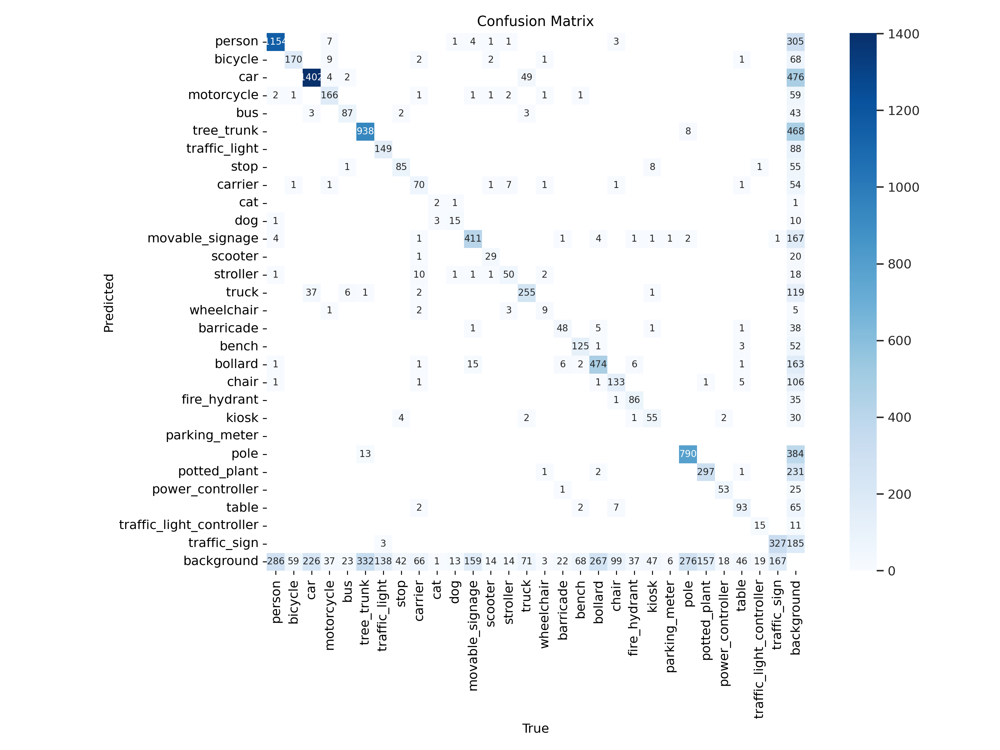

In [ ]:
Image(filename='/content/runs/detect/train2/confusion_matrix.png',width=1000) # epoch 50

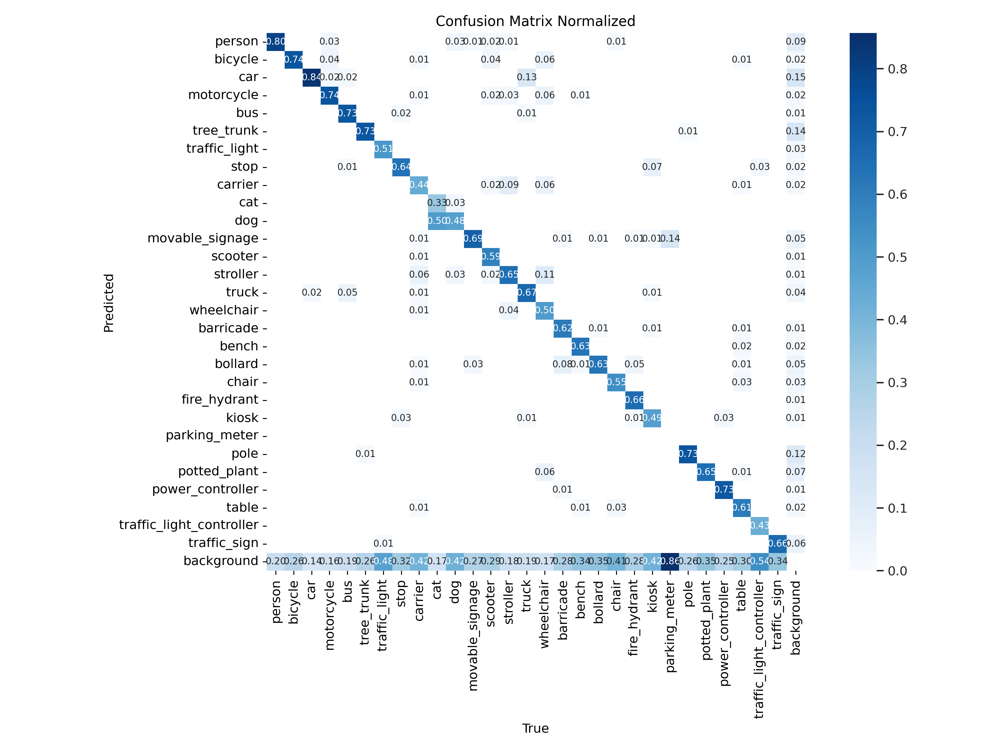

In [ ]:
Image(filename='/content/runs/detect/train2/confusion_matrix_normalized.png',width=1000) # epoch 50

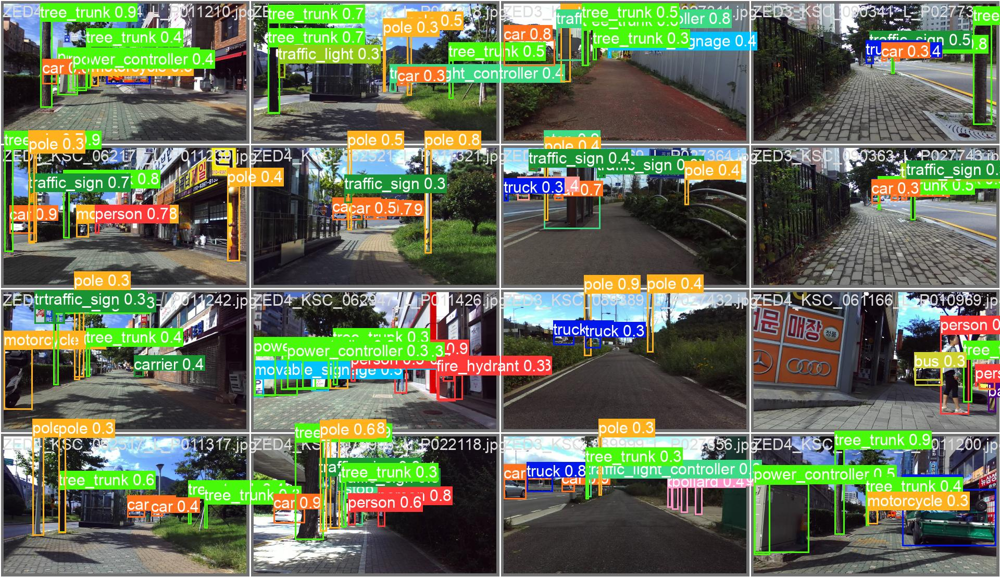

In [ ]:
from PIL import Image
from IPython.display import Image, clear_output
Image(filename='/content/runs/detect/train2/val_batch0_pred.jpg',width=1000) # epoch 50

In [ ]:
import shutil

source_folder = '/content/runs/detect/train2/weights'
destination_folder = '/content/drive/MyDrive/KITA_1026/project/ocr/obstacles_data/yolov8_epoch50'

# 폴더 전체를 복사
shutil.copytree(source_folder, destination_folder)

'/content/drive/MyDrive/KITA_1026/project/ocr/obstacles_data/yolov8_epoch50'

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
results = model.predict(source='/content/data/test/images/', save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1126 /content/data/test/images/MP_SEL_000145.jpg: 576x1024 2 persons, 10 cars, 1 wheelchair, 1 pole, 161.4ms
image 2/1126 /content/data/test/images/MP_SEL_000283.jpg: 576x1024 3 tree_trunks, 9.1ms
image 3/1126 /content/data/test/images/MP_SEL_000347.jpg: 576x1024 4 cars, 1 tree_trunk, 1 movable_signage, 2 chairs, 1 potted_plant, 1 table, 8.3ms
image 4/1126 /content/data/test/images/MP_SEL_000392.jpg: 576x1024 1 tree_trunk, 1 movable_signage, 1 